In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/stable-diffusion-image-to-prompts/sample_submission.csv
/kaggle/input/stable-diffusion-image-to-prompts/prompts.csv
/kaggle/input/stable-diffusion-image-to-prompts/images/f27825b2c.png
/kaggle/input/stable-diffusion-image-to-prompts/images/92e911621.png
/kaggle/input/stable-diffusion-image-to-prompts/images/a4e1c55a9.png
/kaggle/input/stable-diffusion-image-to-prompts/images/20057f34d.png
/kaggle/input/stable-diffusion-image-to-prompts/images/d8edf2e40.png
/kaggle/input/stable-diffusion-image-to-prompts/images/227ef0887.png
/kaggle/input/stable-diffusion-image-to-prompts/images/c98f79f71.png


/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


Notebook Color Schemes:


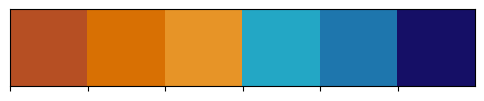

In [2]:
import os
import re
import gc
import wandb
import random
import math
from PIL import Image
from tqdm import tqdm
from pprint import pprint
from time import time
from datetime import datetime
import itertools
import warnings
import pandas as pd
import numpy as np

# For the Visuals
import seaborn as sns
import matplotlib as mpl
from matplotlib import cm
import matplotlib.patches as patches
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.offsetbox import AnnotationBbox, OffsetImage
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
from matplotlib.patches import Rectangle
from IPython.display import display_html
plt.rcParams.update({'font.size': 16})

# Environment check
warnings.filterwarnings("ignore")
os.environ["WANDB_SILENT"] = "true"

# Custom colors
class clr:
    S = '\033[1m' + '\033[94m'
    E = '\033[0m'
    
my_colors = ["#B64F23", "#D87003", "#E79427",
             "#23A7C5", "#1E76AD", "#150F66"]
CMAP1 = ListedColormap(my_colors)

print(clr.S+"Notebook Color Schemes:"+clr.E)
sns.palplot(sns.color_palette(my_colors))
plt.show()

In [3]:
CONFIG = {'competition': 'Image2Text', '_wandb_kernel': 'aot'}

In [4]:
from kaggle_secrets import UserSecretsClient
user_secrets = UserSecretsClient()
secret_value_0 = user_secrets.get_secret("wb_login")

! wandb login $secret_value_0

# Helper Functions 

In [5]:
def get_title_prompts(data, each_n=5):
    '''Add /n to the prompt text (for plotting purposes).'''
    
    new_prompts = []

    for text in data.prompt:
        split_text = text.split(" ")
        new_text = ""
        counter = 1

        for t in split_text:
            new_text += t + " "

            if counter%each_n == 0:
                new_text += "\n"+ " "

            counter += 1

        new_prompts.append(new_text)
    
    data["new_prompts"] = new_prompts
    return data


def show_values_on_bars(axs, h_v="v", space=0.4):
    '''Plots the value at the end of the a seaborn barplot.
    axs: the ax of the plot
    h_v: weather or not the barplot is vertical/ horizontal'''
    
    def _show_on_single_plot(ax):
        if h_v == "v":
            for p in ax.patches:
                _x = p.get_x() + p.get_width() / 2
                _y = p.get_y() + p.get_height()
                value = int(p.get_height())
                ax.text(_x, _y, format(value, ','), ha="center") 
        elif h_v == "h":
            for p in ax.patches:
                _x = p.get_x() + p.get_width() + float(space)
                _y = p.get_y() + p.get_height()
                value = int(p.get_width())
                ax.text(_x, _y, format(value, ','), ha="left")

    if isinstance(axs, np.ndarray):
        for idx, ax in np.ndenumerate(axs):
            _show_on_single_plot(ax)
    else:
        _show_on_single_plot(axs)
        
        
# === 🐝 W&B ===
def save_dataset_artifact(run_name, artifact_name, path, data_type="dataset"):
    '''Saves dataset to W&B Artifactory.
    run_name: name of the experiment
    artifact_name: under what name should the dataset be stored
    path: path to the dataset'''
    
    run = wandb.init(project='InverseSD', 
                     name=run_name, 
                     config=CONFIG)
    artifact = wandb.Artifact(name=artifact_name, 
                              type=data_type)
    artifact.add_file(path)

    wandb.log_artifact(artifact)
    wandb.finish()
    print("Artifact has been saved successfully.")
    
    
def create_wandb_plot(x_data=None, y_data=None, x_name=None, y_name=None, title=None, log=None, plot="line"):
    '''Create and save lineplot/barplot in W&B Environment.
    x_data & y_data: Pandas Series containing x & y data
    x_name & y_name: strings containing axis names
    title: title of the graph
    log: string containing name of log'''
    
    data = [[label, val] for (label, val) in zip(x_data, y_data)]
    table = wandb.Table(data=data, columns = [x_name, y_name])
    
    if plot == "line":
        wandb.log({log : wandb.plot.line(table, x_name, y_name, title=title)})
    elif plot == "bar":
        wandb.log({log : wandb.plot.bar(table, x_name, y_name, title=title)})
    elif plot == "scatter":
        wandb.log({log : wandb.plot.scatter(table, x_name, y_name, title=title)})
        
        
def create_wandb_hist(x_data=None, x_name=None, title=None, log=None):
    '''Create and save histogram in W&B Environment.
    x_data: Pandas Series containing x values
    x_name: strings containing axis name
    title: title of the graph
    log: string containing name of log'''
    
    data = [[x] for x in x_data]
    table = wandb.Table(data=data, columns=[x_name])
    wandb.log({log : wandb.plot.histogram(table, x_name, title=title)})

# Data imports and overview

The structure of our data is as follows:

* prompts - a .csv dataset containing the text that was used to generate the images
* sample_submission - a .csv file containing a sample of how the submission should look like
* images - all the images generated

In [6]:
prompts = pd.read_csv('/kaggle/input/stable-diffusion-image-to-prompts/prompts.csv')
prompts.head()

,imgId,prompt
0,20057f34d,hyper realistic photo of very friendly and dys...
1,227ef0887,"ramen carved out of fractal rose ebony, in the..."
2,92e911621,ultrasaurus holding a black bean taco in the w...
3,a4e1c55a9,a thundering retro robot crane inks on parchme...
4,c98f79f71,"portrait painting of a shimmering greek hero, ..."


In [6]:
print(clr.S+"Shape of train example:"+clr.E, prompts.shape)
print(clr.S+"Prompt's text:"+clr.E, "\n")
for k, txt in enumerate(prompts.prompt):
    print(f"{k}.", txt)

Shape of train example: (7, 2)
Prompt's text: 

0. hyper realistic photo of very friendly and dystopian crater
1. ramen carved out of fractal rose ebony, in the style of hudson river school
2. ultrasaurus holding a black bean taco in the woods, near an identical cheneosaurus
3. a thundering retro robot crane inks on parchment with a droopy french bulldog
4. portrait painting of a shimmering greek hero, next to a loud frill-necked lizard
5. an astronaut standing on a engaging white rose, in the midst of by ivory cherry blossoms
6. Kaggle employee Phil at a donut shop ordering all the best donuts, with a speech bubble that proclaims "Donuts. It's what's for dinner!"


Prompts data structure: 
* the prompts are orientative - as many prompts wanted can be created
* there are only 7 prompt examples

In [8]:
# New Experiment
run = wandb.init(project='Image2Text', name='SampleImages', config=CONFIG)

In [9]:
def show_images_sample(data):
    
    # Get image paths
    root_path = "/kaggle/input/stable-diffusion-image-to-prompts/images/"
    image_paths = [root_path+ID+".png" for ID in data["imgId"]]

    # Plot
    fig, axs = plt.subplots(4, 2, figsize=(23, 30))
    axs = axs.flatten()
    wandb_images = []

    for k, path in enumerate(image_paths):
        axs[k].set_title(f"{k+1}. {data.new_prompts[k]}", 
                         fontsize = 14, color = my_colors[4], weight='bold')
        img = plt.imread(path)
        wandb_images.append(wandb.Image(img))
        axs[k].imshow(img)
        axs[k].axis("off")

    plt.tight_layout()
    fig.delaxes(axs[7])
    plt.show()

    # 🐝 Log Image to W&B
    wandb.log({f"sample_images": wandb_images})

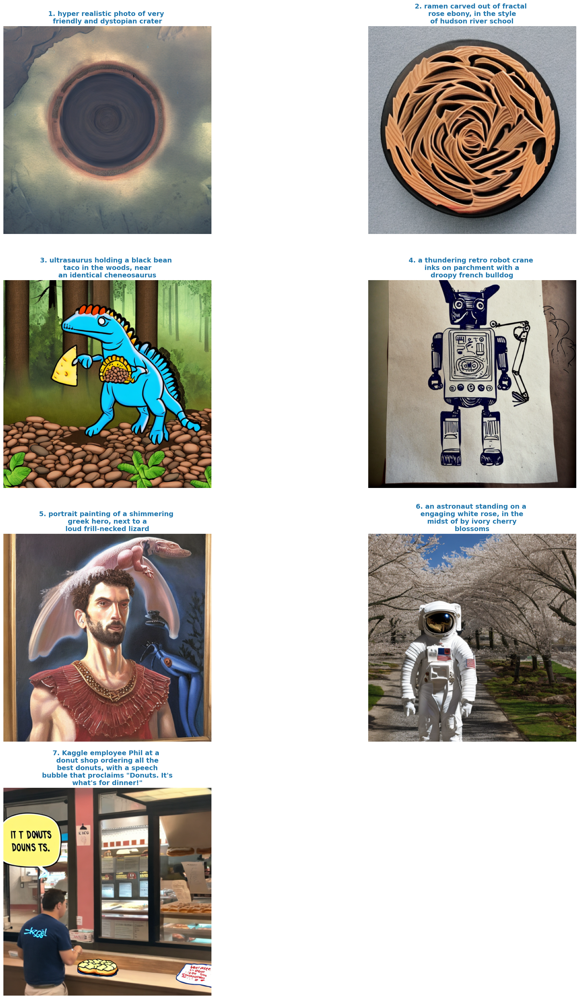

In [10]:
new_data = get_title_prompts(prompts, each_n=5)
show_images_sample(new_data)

Prompts and image analysis:
* There can be oserved that the algorithm sometimes fails, as it does not catch all the details within the text (e.g. "ultrasaurus holding a black bean taco in the woods, near an identical cheneosaurus" - where is the cheneosaurus?)

In [11]:
wandb.finish()

# Generate Images using HuggingFace's diffuser

In [7]:
!nvidia-smi

Thu Oct 26 13:50:21 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.161.03   Driver Version: 470.161.03   CUDA Version: 11.4     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   48C    P8    10W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
|   1  Tesla T4            Off  | 00000000:00:05.0 Off |                    0 |
| N/A   

In [9]:
!pip install diffusers==0.10.2 transformers scipy ftfy accelerate

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 503.1/503.1 kB 9.0 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.1/53.1 kB 3.5 MB/s eta 0:00:00


In [10]:
import torch
from torch import autocast

from diffusers import StableDiffusionPipeline

In [12]:
pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", 
                                               revision="fp16", torch_dtype=torch.float16)

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.


In [13]:
pipe.to("cuda")

StableDiffusionPipeline {
  "_class_name": "StableDiffusionPipeline",
  "_diffusers_version": "0.10.2",
  "feature_extractor": [
    "transformers",
    "CLIPFeatureExtractor"
  ],
  "requires_safety_checker": true,
  "safety_checker": [
    "stable_diffusion",
    "StableDiffusionSafetyChecker"
  ],
  "scheduler": [
    "diffusers",
    "PNDMScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

> Testing the pipeline

In [14]:
def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size
    
    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

In [15]:
N = 3
prompt = ["futuristic synthwave city, retro sunset, crystals, spires, volumetric lighting, studio Ghibli style, rendered in unreal engine with clean details "]*N

with autocast("cuda"):
    images = pipe(prompt).images
    
grid = image_grid(images, rows=1, cols=3)

  0%|          | 0/50 [00:00<?, ?it/s]

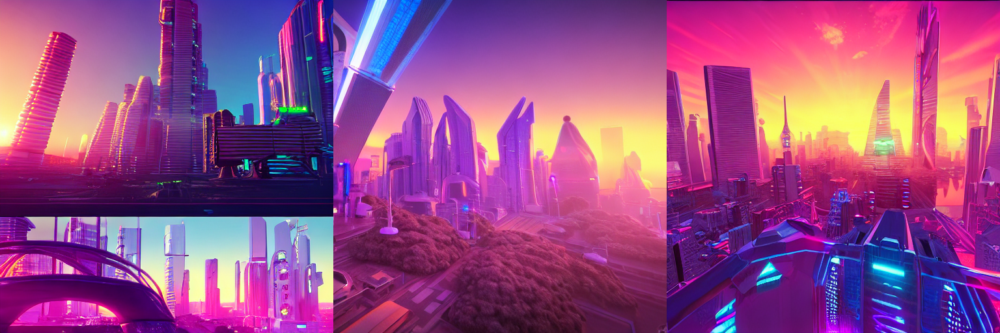

In [16]:
grid

In [17]:
N = 3
prompt = ["living room of a cozy wooden house with a fireplace, interior design, d & d concept art, warm"]*N

with autocast("cuda"):
    images = pipe(prompt).images
    
grid = image_grid(images, rows=1, cols=3)

  0%|          | 0/50 [00:00<?, ?it/s]

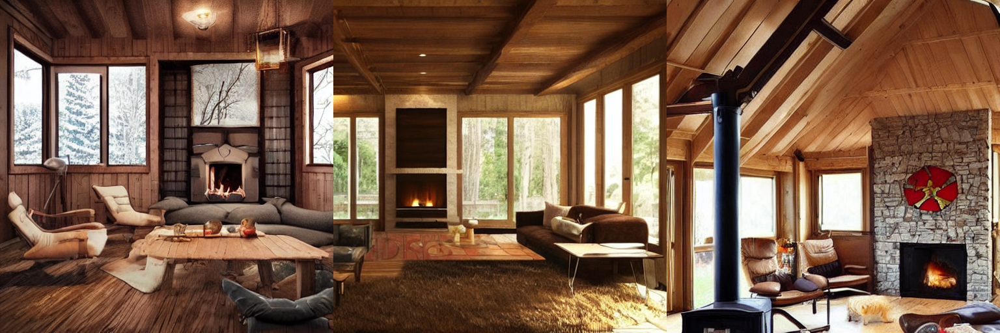

In [18]:
grid

# Stable-Diffusion-Prompts Dataset

In [19]:
run = wandb.init(project='Image2Text', name='SDPrompts', config=CONFIG)

In [20]:
from datasets import load_dataset
dataset = load_dataset("Gustavosta/Stable-Diffusion-Prompts")

Extracting data files:   0%|          | 0/2 [00:00<?, ?it/s]

Dataset parquet downloaded and prepared to /root/.cache/huggingface/datasets/parquet/Gustavosta--Stable-Diffusion-Prompts-c1ff13816f6df3a0/0.0.0/0b6d5799bb726b24ad7fc7be720c170d8e497f575d02d47537de9a5bac074901. Subsequent calls will reuse this data.


  0%|          | 0/2 [00:00<?, ?it/s]

In [21]:
print(clr.S+"Length of Train data:"+clr.E, len(dataset["train"]["Prompt"]))
print(clr.S+"Length of Test data:"+clr.E, len(dataset["test"]["Prompt"]))

wandb.log({"train_no_prompts": len(dataset["train"]["Prompt"]),
           "test_no_prompts": len(dataset["test"]["Prompt"])})

Length of Train data: 73718
Length of Test data: 8192


In [22]:
train = pd.DataFrame(dataset["train"]["Prompt"], columns=["prompt"])
test = pd.DataFrame(dataset["test"]["Prompt"], columns=["prompt"])

df = pd.concat([train, test], axis=0).reset_index(drop=True)

# Save df
df.to_parquet("stable_diffusion_prompts.parquet", index=False)

df.head()

,prompt
0,realistic car 3 d render sci - fi car and sci ...
1,a comic potrait of a female necromamcer with b...
2,"steampunk market interior, colorful, 3 d scene..."
3,"“A portrait of a cyborg in a golden suit, D&D ..."
4,A full portrait of a beautiful post apocalypti...


# Exploring prompts

Prompt: a destroyed clock tower in a destroyed London at sunrise, ruins, clouds in the sky, concept art, octane render, unreal engine 5, trending on Artstation, high quality, 8K, soft lighting, highly detailed, trending on DeviantArt, mossy, apocaliptic, serene landscape, beautiful, cgsociety, godrays, path traced


  0%|          | 0/50 [00:00<?, ?it/s]

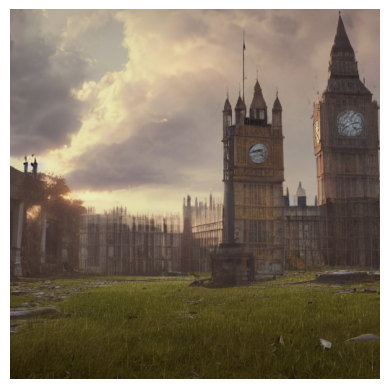

Prompt: cabin high on a mountain, the valley beneath, dynamic lighting, photorealistic fantasy concept art, trending on art station, stunning visuals, creative, cinematic, ultra detailed


  0%|          | 0/50 [00:00<?, ?it/s]

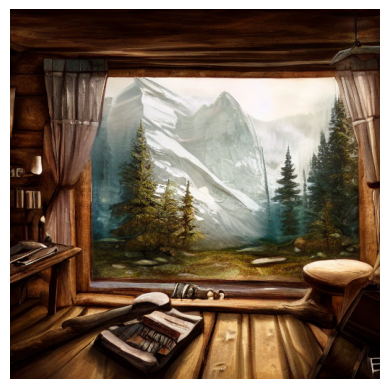

Prompt: portrait of a man by greg rutkowski, he looks like tye sheridan, he is about 2 0 years old, messy brown hair, tired eyes, he is wearing a black hoodie with hood, highly detailed portrait, digital painting, artstation, concept art, smooth, sharp foccus ilustration, artstation hq


  0%|          | 0/50 [00:00<?, ?it/s]

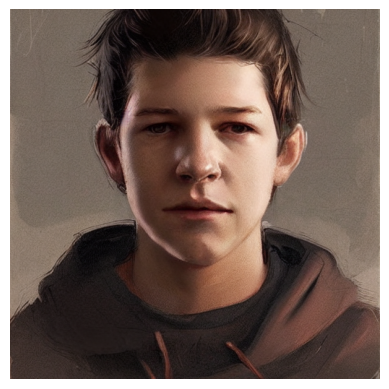

Prompt: steampunk cybernetic biomechanical ganesha, front facing, symmetric, 3 d model, very coherent symmetrical artwork, unreal engine realistic render, 8 k, micro detail, intricate, elegant, highly detailed, centered, digital painting, artstation, smooth, sharp focus, illustration, artgerm, tomasz alen kopera, wlop


  0%|          | 0/50 [00:00<?, ?it/s]

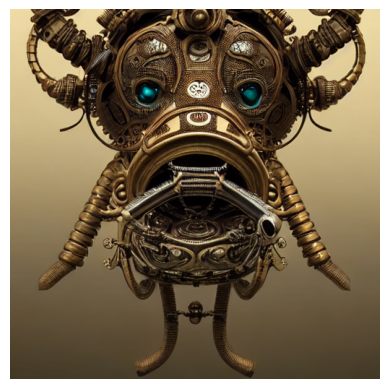

Prompt: handsome cute black dragon in snowy forest, dnd character, cinematic view, epic sky, detailed, concept art, low angle, high detail, warm lighting, volumetric, godrays, vivid, beautiful, trending on artstation, by jordan grimmer, huge scene, grass, art greg rutkowski


  0%|          | 0/50 [00:00<?, ?it/s]

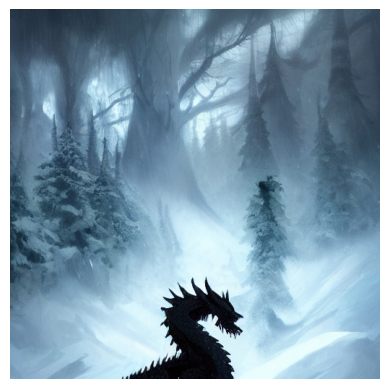

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['hyper - detailed, hd, hdr, 4 k, 8 k']


Prompt: cinematic bust portrait of psychedelic monkey from left, head and chest only, exotic alien features, robotic enhancements, desaturated, Tim Hildebrandt, Wayne Barlowe, Bruce Pennington, donato giancola, larry elmore, oil on canvas, masterpiece, trending on artstation, featured on pixiv, cinematic composition, dramatic pose, beautiful lighting, sharp, details, hyper-detailed, HD, HDR, 4K, 8K


  0%|          | 0/50 [00:00<?, ?it/s]

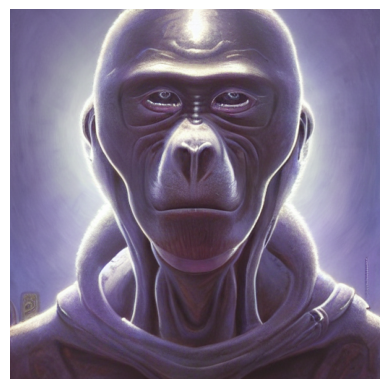

Prompt: Bumble Bee  in apex legends as an anime character digital illustration portrait design by Ross Tran, artgerm detailed, soft lighting


  0%|          | 0/50 [00:00<?, ?it/s]

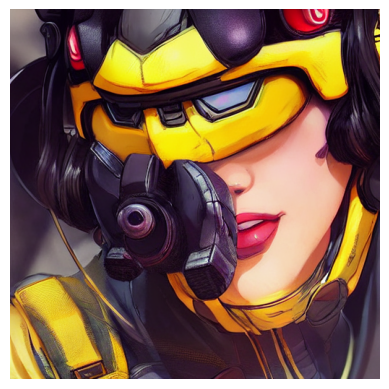

Prompt: tom ellis ( lucifer ) portrait sitting in a burning chair, art nouveau, fantasy, intricate flower designs, elegant, highly detailed, sharp focus, art by artgerm and greg rutkowski and wlop


  0%|          | 0/50 [00:00<?, ?it/s]

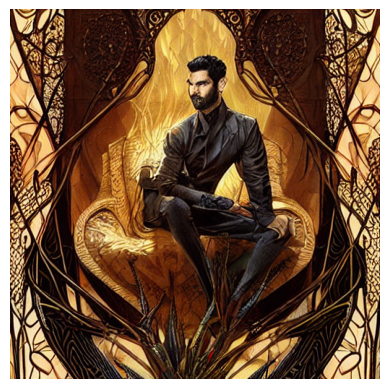

Prompt: tesla, highly detailed, d & d, fantasy, highly detailed, digital painting, trending on artstation, concept art, sharp focus, illustration, global illumination, ray tracing, realistic shaded, art by artgerm and greg rutkowski and fuji choko and viktoria gavrilenko and hoang lap


  0%|          | 0/50 [00:00<?, ?it/s]

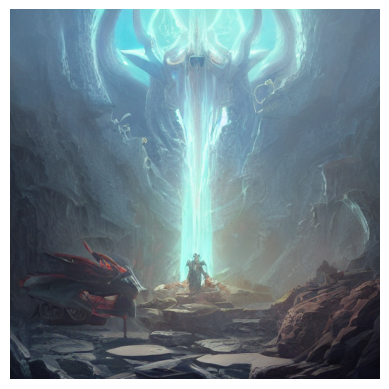

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['), 8 k, eric zener, zdzisław beksiński, dark background']


Prompt: 3d fractal wallpaper by Escher, geometrical figures, mandelbulb, fragmentarium, 3d effect, picture through the screen, spirals tubes roots, completely filled space, psychedelic!!, 3d fractal background, digital art, high details, depth of field, hard lighting!, trending on artstation, deviantart, octane render, HD, (((Low light))), 8k, eric zener, zdzisław beksiński, dark background


  0%|          | 0/50 [00:00<?, ?it/s]

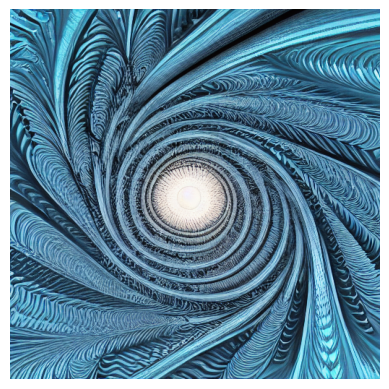

In [25]:
idxs = [63559, 75449, 39920, 72911, 26482, 3552, 42001, 8629, 59176, 13947, ]

for prompt in df.filter(items = idxs, axis=0)["prompt"]:
    
    print(clr.S+"Prompt:"+clr.E, prompt)
    with autocast("cuda"):
        image = pipe(prompt).images[0]
        plt.imshow(image)
        plt.axis("off")
        plt.show();

In [26]:
df["len"] = df["prompt"].apply(lambda x: len(x.split(" ")))

df["len"].describe()

count    81910.000000
mean        36.755866
std         15.410241
min          1.000000
25%         27.000000
50%         36.000000
75%         44.000000
max        271.000000
Name: len, dtype: float64

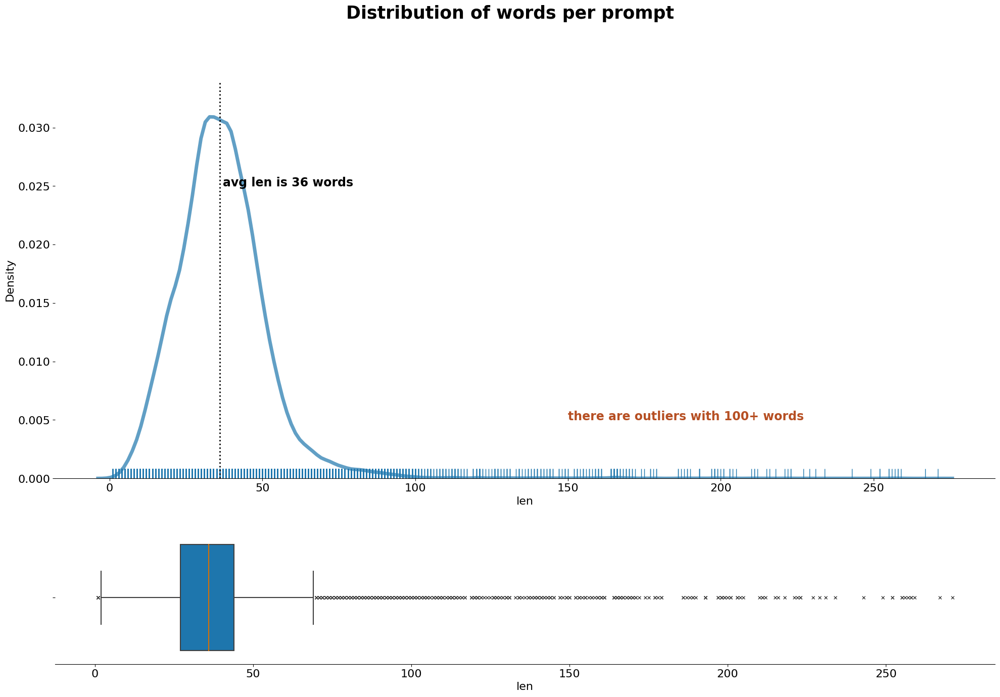

In [27]:
f, (a0, a1) = plt.subplots(2, 1, gridspec_kw={'height_ratios': [3, 1]}, figsize=(24, 15))
sns.distplot(df["len"], rug=True, hist=False, 
             rug_kws={"color": my_colors[4]},
             kde_kws={"color": my_colors[4], "lw": 5, "alpha": 0.7},
             ax=a0)

a0.axvline(x=36, ls=":", lw=2, color="black")
a0.text(x=37, y=0.025, s="avg len is 36 words", size=17, color="black", weight="bold")
a0.text(x=150, y=0.005, s="there are outliers with 100+ words", 
        size=17, color=my_colors[0], weight="bold")

sns.boxplot(x=df["len"], ax=a1, notch=False, showcaps=True, 
            flierprops={"marker": "x"},
            boxprops={"facecolor": my_colors[4]},
            medianprops={"color": my_colors[1]},)

plt.suptitle("Distribution of words per prompt", weight="bold", size=25)
sns.despine(right=True, top=True, left=True);

In [28]:
create_wandb_hist(x_data=df["len"], 
                  x_name="prompt length",
                  title="Distribution of words per prompt",
                  log="prompt_len_hist")

In [29]:
wandb.finish()

# Prompts part of speech

Used nltk to identify and extract the Part of Speech within the prompts

In [30]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize, sent_tokenize
stop_words = set(stopwords.words('english'))

In [31]:
run = wandb.init(project='Image2Text', name='pos_explore', config=CONFIG)

In [32]:
def get_pos(x):
    
    tokenized = sent_tokenize(x)
    
    for i in tokenized:

        # words & punctuation
        wordsList = nltk.word_tokenize(i)

        # Remove stop words from wordList
        wordsList = [w for w in wordsList if not w in stop_words]

        # Identify Part Of Speech
        tagged = nltk.pos_tag(wordsList)
        
        return tagged

df["pos"] = df["prompt"].apply(lambda x: get_pos(x))

df["pos_simple"] = df["pos"].apply(lambda x: [j for (i, j) in x])

df.head()

,prompt,len,pos,pos_simple
0,realistic car 3 d render sci - fi car and sci ...,74,"[(realistic, JJ), (car, NN), (3, CD), (render,...","[JJ, NN, CD, NN, NN, :, NN, NN, NN, :, NN, JJ,..."
1,a comic potrait of a female necromamcer with b...,52,"[(comic, JJ), (potrait, NN), (female, JJ), (ne...","[JJ, NN, JJ, NN, JJ, NN, NNS, ,, JJ, :, NN, ,,..."
2,"steampunk market interior, colorful, 3 d scene...",26,"[(steampunk, NN), (market, NN), (interior, NN)...","[NN, NN, NN, ,, NN, ,, CD, NN, ,, NN, NN, ,, N..."
3,"“A portrait of a cyborg in a golden suit, D&D ...",17,"[(“, VB), (A, DT), (portrait, NN), (cyborg, NN...","[VB, DT, NN, NN, JJ, NN, ,, NNP, CC, NNP, NN, ..."
4,A full portrait of a beautiful post apocalypti...,33,"[(A, DT), (full, JJ), (portrait, NN), (beautif...","[DT, JJ, NN, JJ, NN, JJ, NN, JJ, ,, JJ, ,, JJ,..."


* NN noun, singular ‘- desk’
* JJ adjective – ‘big’
* NNP proper noun, singular – ‘Harrison’
* NNS noun plural – ‘desks’
* VBG verb, gerund/present participle – taking
* RB adverb – very, silently,
* CD cardinal digit
* VBD verb, past tense – took
* CC coordinating conjunction
* VBN verb, past participle – taken
* VBP verb, sing. present, non-3d – take
* etc.

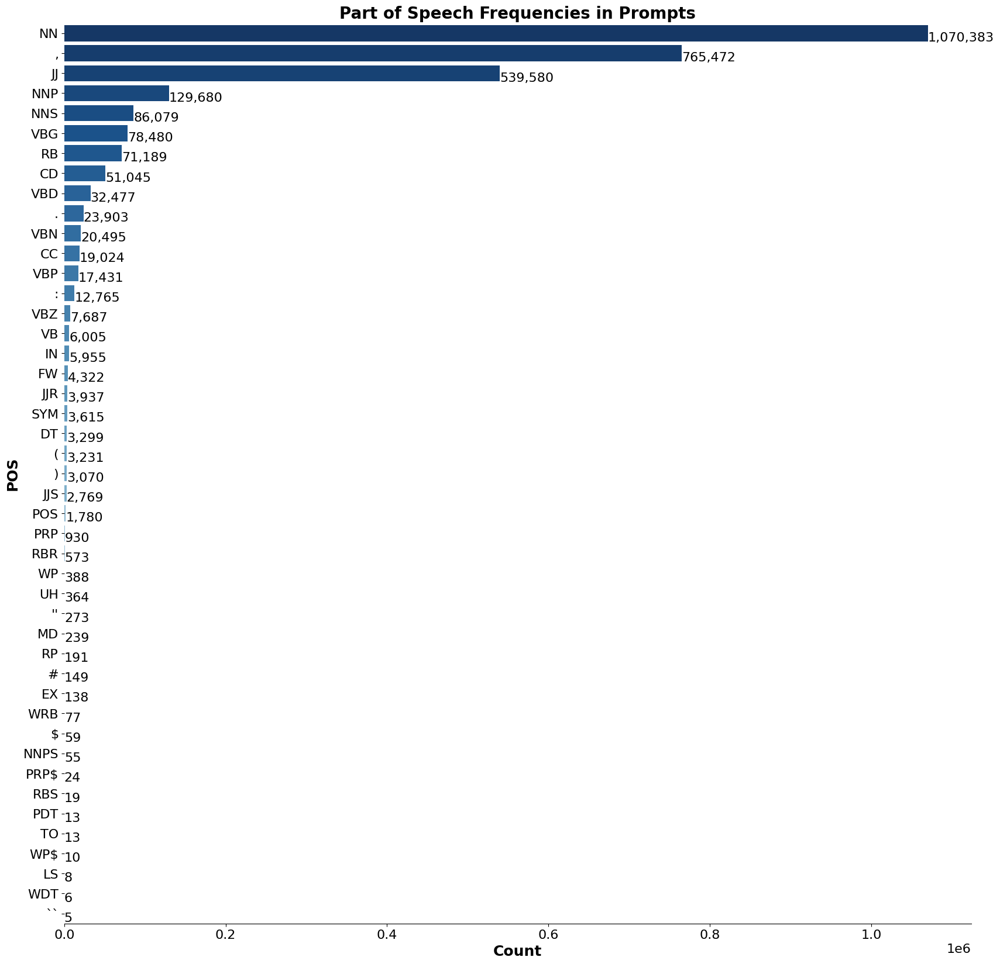

In [33]:
# Plot frequencies
pos_count = df.explode("pos_simple")["pos_simple"].value_counts().reset_index()
pos_count.columns = ["pos", "count"]

plt.figure(figsize=(20, 20))

figure = sns.barplot(data=pos_count,
                     x="count", y="pos", color=my_colors[4], palette="Blues_r")
show_values_on_bars(figure, h_v="h", space=0.4)
plt.title('Part of Speech Frequencies in Prompts', weight="bold", size=20)

plt.xlabel("Count", size = 18, weight="bold")
plt.ylabel("POS", size = 18, weight="bold")
    
sns.despine(right=True, top=True, left=True);

In [34]:
create_wandb_plot(x_data=pos_count["pos"],
                  y_data=pos_count["count"],
                  x_name="POS", y_name="Count",
                  title="Part of Speech Frequencies in Prompts",
                  log="pos_count", plot="bar")

**Most frequent words per top POS**

In [35]:
all_pos = []
all_words = []

for l in tqdm(df["pos"]):
    positions = [y for x, y in l]
    words = [x for x, y in l]
    
    all_pos.extend(positions)
    all_words.extend(words)
    
# Create DF
pos_words = pd.DataFrame({"POS": all_pos, 
                          "word": all_words})

100%|██████████| 81910/81910 [00:00<00:00, 132848.21it/s]


In [38]:
summary = pos_words.value_counts().reset_index()

summary = summary[summary["POS"].isin(["NN", "JJ", "NNP", "NNS", "VBG", "RB"])]

summary = summary.groupby(["POS"]).head(5)

In [54]:
summary

,POS,word,count
1,NN,art,61072
2,NN,artstation,46568
3,JJ,detailed,38256
4,JJ,concept,33020
5,JJ,digital,31856
6,RB,highly,31496
7,NN,painting,28937
8,JJ,sharp,27460
9,NN,focus,26284
10,VBG,trending,25255


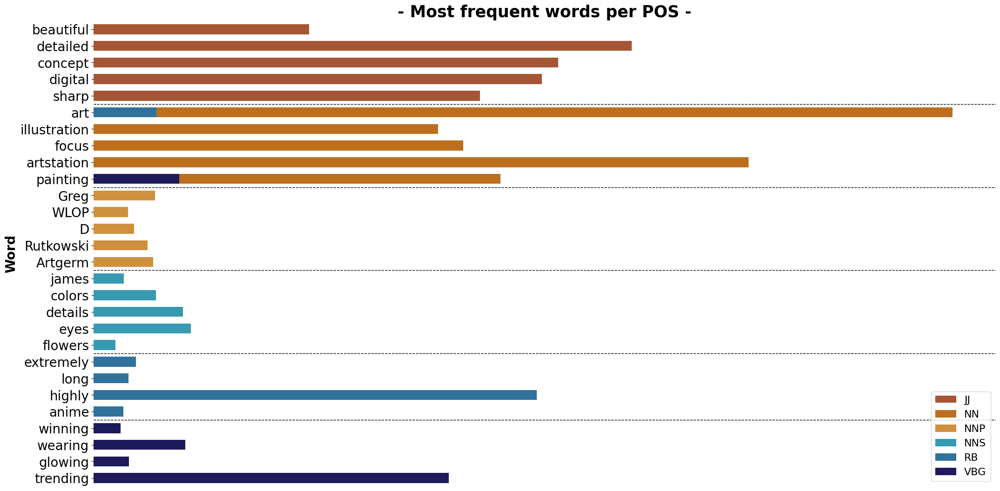

In [55]:
fig, ax = plt.subplots(figsize=(25, 13))
plt.title('- Most frequent words per POS -', size=25, weight="bold")

sns.barplot(data=summary.sort_values(["POS"]),
            y="word", x="count", hue="POS", 
            width=0.6, dodge=False, palette=my_colors)
# show_values_on_bars(axs=ax, h_v="h", space=0.2)
plt.ylabel("Word", size = 20, weight="bold")
plt.yticks(size=20)
plt.xlabel("")
plt.xticks([])

# Vertical lines
plt.axhline(y=4.5, xmin=0, xmax=100, color='black', ls='--', lw=1)
plt.axhline(y=9.5, xmin=0, xmax=100, color='black', ls='--', lw=1)
plt.axhline(y=14.5, xmin=0, xmax=100, color='black', ls='--', lw=1)
plt.axhline(y=19.5, xmin=0, xmax=100, color='black', ls='--', lw=1)
plt.axhline(y=23.5, xmin=0, xmax=100, color='black', ls='--', lw=1)

plt.legend(loc='lower right')
sns.despine(left=True, bottom=True);

In [56]:
wandb.finish()

In [58]:
save_dataset_artifact(run_name="train_prompts", 
                      artifact_name="SD_prompts", 
                      path="/kaggle/working/stable_diffusion_prompts.parquet",
                      data_type="dataset")

Artifact has been saved successfully.
